In [ ]:
import os
import tensorflow as tf
import tf_keras as keras

import matplotlib.pyplot as plt
import numpy as np
import cv2

print(f"TensorFlow Version: {tf.__version__}")
print(f"Keras Version: {keras.__version__}")

TensorFlow Version: 2.20.0
Keras Version: 2.20.1


In [20]:
# total memory
total_memory = os.sysconf('SC_PAGE_SIZE') * os.sysconf('SC_PHYS_PAGES')
safe_limit = int(total_memory * 0.9)
# resource.setrlimit(resource.RLIMIT_AS, (safe_limit, total_memory)) # makes a bug if too memory is being used 

print(f"Mem limit : {safe_limit / 1024**3:.2f} Gb")

Mem limit : 6.84 Gb


In [21]:
!ls -l big_data_step1/fake | wc -l
!ls -l big_data_step1/real | wc -l
!pwd

18883
18942
/home/ubuntu/fresh_start/Project


In [22]:
PATH = '/home/ubuntu/fresh_start/Project/'
DIR_FAKE = PATH + "big_data_step1/fake/"
DIR_REAL = PATH + "big_data_step1/real/"
MODEL    = PATH + 'model/xception_faceforensics.h5'
N_IMGS = 18880
MULTI_THRESHOLD = False
ZOOM_FACTOR = 1.0
LAPLACIAN_MIN = .1

In [23]:
class FixedDepthwiseConv2D(keras.layers.DepthwiseConv2D):
    def __init__(self, **kwargs):
        # Nobuco added 'groups', we need to pop them
        if 'groups' in kwargs:
            kwargs.pop('groups')
        super().__init__(**kwargs)


print(f"Loading {MODEL} with custom patch...")

model = keras.models.load_model(
    MODEL, 
    custom_objects={'DepthwiseConv2D': FixedDepthwiseConv2D}
)

print("Model loaded successfully")
print(f"Input Shape: {model.input_shape}")

Loading /home/ubuntu/fresh_start/Project/model/xception_faceforensics.h5 with custom patch...
Model loaded successfully
Input Shape: (1, 299, 299, 3)


In [24]:
def softmax(x):
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum()

In [25]:
def preprocess_image(img):
    if img is None: return None
    
    # BGR -> RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    img = cv2.resize(img, (299, 299))
    
    
    # [-1, 1]
    img = img.astype(np.float32) / 127.0 - 1.0
    
    # Batch dim -> (1, 299, 299, 3)
    img_tensor = tf.convert_to_tensor(img)
    img_tensor = tf.expand_dims(img_tensor, axis=0)
    
    return img_tensor

In [26]:
def get_laplacian_variance_score(img):
    if img is None:
        return 0.0

    # Convert to Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()

   
    threshold = 500 
    score = 1 / (1 + np.exp(-(laplacian_var - threshold) / 100))

    return score
    # return 1.0 # 

In [27]:
def zoom_center(img, zoom_factor=1.5):
    y_size, x_size, _ = img.shape

    crop_h = int(y_size / zoom_factor)
    crop_w = int(x_size / zoom_factor)
    
    y1 = int((y_size - crop_h) / 2)
    x1 = int((x_size - crop_w) / 2)
    y2 = y1 + crop_h
    x2 = x1 + crop_w
    
    # Crop
    img_cropped = img[y1:y2, x1:x2]

    img_zoomed = cv2.resize(img_cropped, (x_size, y_size), interpolation=cv2.INTER_LINEAR)
    
    return img_zoomed

In [11]:
# Pour deepnote:

print(f"fnames_real={os.listdir(DIR_REAL)}")

fnames_real=['369_0009.jpg', '945_0008.jpg', '089_0002.jpg', '657_0017.jpg', '922_0019.jpg', '550_0004.jpg', '574_0019.jpg', '411_0011.jpg', '779_0005.jpg', '172_0018.jpg', '576_0014.jpg', '854_0010.jpg', '856_0001.jpg', '055_0001.jpg', '399_0011.jpg', '298_0001.jpg', '853_0006.jpg', '929_0015.jpg', '829_0001.jpg', '737_0007.jpg', '962_0007.jpg', '225_0013.jpg', '700_0005.jpg', '137_0001.jpg', '479_0019.jpg', '316_0006.jpg', '160_0004.jpg', '804_0018.jpg', '977_0006.jpg', '805_0006.jpg', '667_0000.jpg', '130_0004.jpg', '323_0001.jpg', '458_0010.jpg', '686_0000.jpg', '835_0014.jpg', '320_0012.jpg', '746_0016.jpg', '877_0015.jpg', '525_0016.jpg', '208_0018.jpg', '581_0017.jpg', '670_0008.jpg', '834_0017.jpg', '196_0013.jpg', '279_0010.jpg', '023_0014.jpg', '383_0018.jpg', '490_0005.jpg', '404_0010.jpg', '718_0005.jpg', '209_0005.jpg', '469_0015.jpg', '260_0000.jpg', '996_0012.jpg', '012_0000.jpg', '040_0009.jpg', '816_0013.jpg', '958_0006.jpg', '253_0012.jpg', '390_0005.jpg', '036_0008.j

In [12]:
# Pour deepnote:

print(f"fnames_fake={os.listdir(DIR_FAKE)}")

fnames_fake=['402_453_0007.jpg', '372_413_0010.jpg', '925_933_0007.jpg', '917_924_0006.jpg', '105_180_0013.jpg', '465_482_0002.jpg', '748_355_0012.jpg', '104_126_0000.jpg', '644_657_0008.jpg', '095_053_0014.jpg', '181_199_0012.jpg', '813_700_0000.jpg', '920_811_0012.jpg', '845_846_0018.jpg', '375_251_0019.jpg', '860_905_0008.jpg', '974_953_0008.jpg', '316_369_0005.jpg', '365_307_0015.jpg', '910_911_0015.jpg', '028_068_0015.jpg', '400_476_0002.jpg', '667_446_0000.jpg', '687_615_0017.jpg', '776_676_0005.jpg', '718_972_0016.jpg', '730_815_0011.jpg', '252_266_0014.jpg', '826_833_0008.jpg', '749_659_0001.jpg', '167_166_0016.jpg', '019_018_0017.jpg', '270_297_0019.jpg', '428_466_0001.jpg', '464_463_0016.jpg', '097_033_0012.jpg', '884_968_0006.jpg', '326_501_0003.jpg', '130_139_0011.jpg', '101_096_0013.jpg', '762_832_0013.jpg', '074_825_0003.jpg', '352_319_0003.jpg', '122_144_0013.jpg', '289_228_0006.jpg', '159_175_0011.jpg', '815_730_0005.jpg', '571_746_0008.jpg', '003_000_0014.jpg', '500_59

In [28]:
real_imgs = []
fake_imgs = []

real_imgs_names = []
fake_imgs_names = []


print("loading real imgs")
iter=0
for fname in os.listdir(DIR_REAL):
    if iter >= N_IMGS: break
    iter += 1
    path = os.path.join(DIR_REAL, fname)
    if 'jpg' not in path: continue
    img = cv2.imread(path)
    img = np.array(img)
    if img is not None and img.shape != ():
        img = zoom_center(img, ZOOM_FACTOR)
        if get_laplacian_variance_score(img) > LAPLACIAN_MIN:
            real_imgs.append(img)
        real_imgs_names.append(fname)

print("loading fake imgs")
iter=0 
for fname in os.listdir(DIR_FAKE):
    if iter >= N_IMGS: break
    iter += 1
    path = os.path.join(DIR_FAKE, fname)
    if 'jpg' not in path: continue
    img = cv2.imread(path)
    img = np.array(img)
    if img is not None and img.shape != ():
        img = zoom_center(img, ZOOM_FACTOR)
        if get_laplacian_variance_score(img) > LAPLACIAN_MIN:
            fake_imgs.append(img)
    fake_imgs_names.append(fname)

print(f"Successfully loaded {len(real_imgs)} real images and {len(fake_imgs)} real images")
min_len = min(len(real_imgs), len(fake_imgs), N_IMGS)
print("Keeping the", min_len, "first images of each dataset")



fake_imgs = fake_imgs[:min_len]
real_imgs = real_imgs[:min_len]

# names are broken here
# fake_imgs_names = fake_imgs_names[:min_len]
# real_imgs_names = real_imgs_names[:min_len]

if any(img is None for img in real_imgs) or any(img is None for img in fake_imgs):
    print("Error, None detected. One or more images failed to load.")

loading real imgs
loading fake imgs
Successfully loaded 2203 real images and 1822 real images
Keeping the 1822 first images of each dataset


In [ ]:
# print(f"Pixels range (first image): Min: {preprocess_image(real_imgs[0]).min():.2f}, Max: {preprocess_image(real_imgs[0]).max():.2f}, Mean: {preprocess_image(real_imgs[0]).mean():.2f}")

In [ ]:
### EVALUATION

In [ ]:
# !du -h model

In [15]:
probas_fake = []   # actual fakes
probas_real = []   # actual reals

In [16]:
print("making predictions on the fake dataset, processing", len(fake_imgs), 'images')

print("[" + ">"*100 + "]")
print("[", end ='', flush=True)
for i, fake_img in enumerate(fake_imgs):
    if len(fake_imgs) > 98 and i % (len(fake_imgs)//98) == 0: print('>', end='', flush=True)
    prob_fake = softmax(model.predict(preprocess_image(fake_img), verbose=0)[0])[1]
    probas_fake.append(prob_fake)
print("]")

making predictions on the fake dataset, processing 1822 images
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>]
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>]


In [17]:
print("making predictions on the real dataset, processing", len(real_imgs), 'images')

print("[" + ">"*100 + "]")
print("[", end ='', flush=True)
for i, real_img in enumerate(real_imgs):
    if len(real_imgs) > 98 and  i % (len(real_imgs)//98) == 0: print('>', end='', flush=True)
    prob_fake = softmax(model.predict(preprocess_image(real_img), verbose=0)[0])[1]
    probas_real.append(prob_fake)
print("]")

making predictions on the real dataset, processing 1822 images
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>]
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>]


In [ ]:
from sklearn.metrics import classification_report

print(f"'fake' prob on actual fakes: mean={np.mean(probas_fake):.3f}, std={np.std(probas_fake):.3f}")
print(f"'fake' prob on actual reals: mean={np.mean(probas_real):.3f}, std={np.std(probas_real):.3f}")

# y_true
y_true = np.concatenate([np.ones(len(probas_fake)), np.zeros(len(probas_real))])

# y_pred
# put all probabilities into one array
y_probs = np.concatenate([probas_fake, probas_real])
if MULTI_THRESHOLD:
    for th in range(80, 100, 1):
        thh = th/100
        print(f"Threshold = {thh}")
        y_pred = (y_probs > thh).astype(int)
        
        print(classification_report(y_true, y_pred, target_names=['Real (0)', 'Fake (1)']))
else:
    threshold = .65
    print(f"Threshold = {threshold}")
    y_pred = (y_probs > threshold).astype(int)
    
    print(classification_report(y_true, y_pred, target_names=['Real (0)', 'Fake (1)']))

'fake' prob on actual fakes: mean=0.970, std=0.137
'fake' prob on actual reals: mean=0.382, std=0.424
Threshold = 0.65
              precision    recall  f1-score   support

    Real (0)       0.96      0.64      0.77      1822
    Fake (1)       0.73      0.97      0.83      1822

    accuracy                           0.81      3644
   macro avg       0.84      0.81      0.80      3644
weighted avg       0.84      0.81      0.80      3644



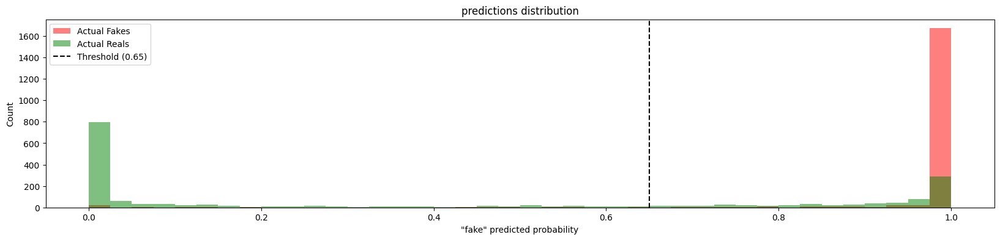

In [19]:
# Visualisation
plt.figure(figsize=(20, 4))


plt.hist(probas_fake, bins=40, alpha=0.5, label='Actual Fakes', color='red')
plt.hist(probas_real, bins=40, alpha=0.5, label='Actual Reals', color='green')
plt.axvline(x=threshold, color='black', linestyle='--', label=f'Threshold ({threshold})')

plt.xlabel('"fake" predicted probability')
plt.ylabel('Count')
plt.legend()
plt.title('predictions distribution')
plt.show()

## Worst predicted images

================================================== DEEPFAKES ==================================================


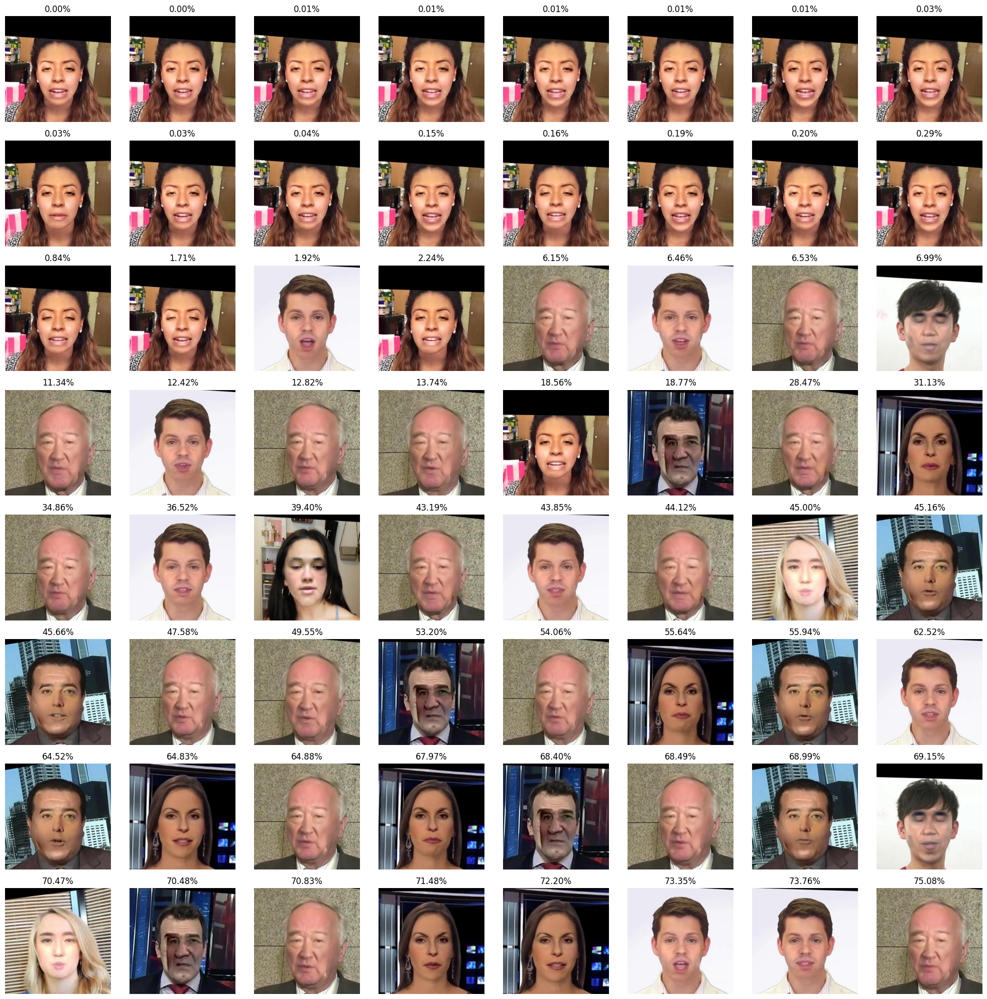

In [20]:
print('='*50 + " DEEPFAKES " + "="*50)

col, row = 8, 8

#sort
idxs = sorted(range(len(probas_fake)), key=lambda i: probas_fake[i])

fig, a = plt.subplots(col, row, figsize=(20, 20))
a = a.flatten()
disp=0
for k in range(col * row):
    if k >= len(idxs): continue
    i = idxs[k]
    if i >= len(fake_imgs): continue
    img = fake_imgs[i]

    # remove batch dimension:
    if img.ndim == 4 and img.shape[0] == 1:
        img = img[0]

    if img.shape[0] in (1, 3):           # CHW
        img = img.transpose(1, 2, 0)
    elif img.shape[1] in (1, 3):         # HCW
        img = img.transpose(0, 2, 1)

    img_display = img.copy()
    
    # FIX: Convert BGR to RGB for Matplotlib
    img_display = cv2.cvtColor(img_display, cv2.COLOR_BGR2RGB)
    
    a[disp].imshow(img_display)
    a[disp].set_title(f"{probas_fake[i]*100:.2f}%")
    a[disp].axis('off')
    disp+=1

plt.tight_layout()
plt.show()


================================================== REAL IMAGES ==================================================


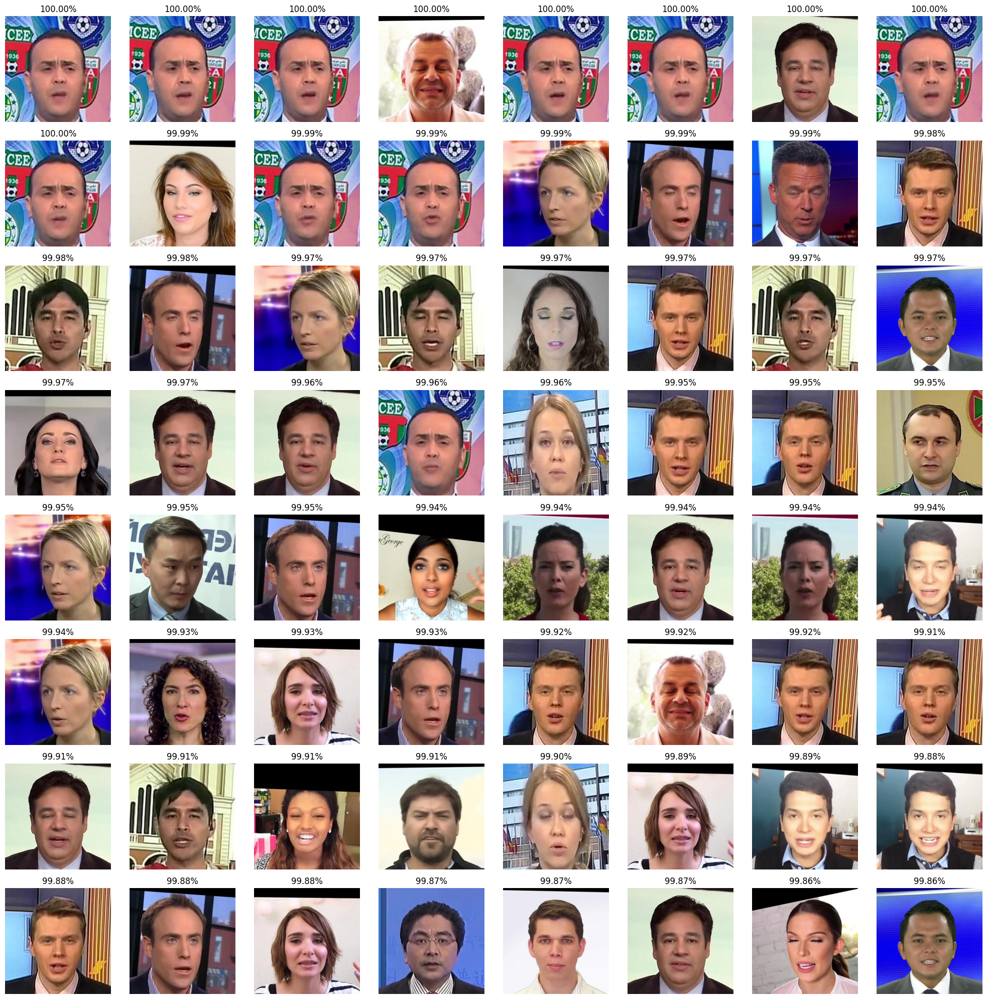

In [21]:
print('='*50 + " REAL IMAGES " + "="*50)

col, row = 8, 8

idxs = sorted(range(len(probas_real)), key=lambda i: 1-probas_real[i])

fig, a = plt.subplots(col, row, figsize=(20, 20))
a = a.flatten()
disp=0
for k in range(col * row):
    if k >= len(idxs): continue
    i = idxs[k]
    if i >= len(real_imgs): continue

    img = real_imgs[i]

    if img.ndim == 4 and img.shape[0] == 1:
        img = img[0]

    if img.shape[0] in (1, 3):       # CHW → transpose
            img = img.transpose(1, 2, 0) # HWC

    elif img.shape[1] in (1, 3):     # HCW → move channel to end
        img = img.transpose(0, 2, 1) # HWC

    elif img.shape[2] in (1, 3):     # already HWC
        pass

    img_display = img.copy()
    
    # FIX: Convert BGR to RGB for Matplotlib
    img_display = cv2.cvtColor(img_display, cv2.COLOR_BGR2RGB)
    
    a[disp].imshow(img_display)
    a[disp].set_title(f"{probas_real[i]*100:.2f}%")
    a[disp].axis('off')
    disp+=1

plt.tight_layout()
plt.show()
